In [2]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix
from itertools import product

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
sns.set_context('notebook')

# %matplotlib notebook
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200

%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx
from embed import proj_
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.express as px
pyo.init_notebook_mode()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import torch.nn.functional as F
def plot_pairwise_dist(dists, configs, 
                    cconds=[lambda x: True], 
                    rconds=[lambda x: True], 
                    tidxs=slice(0, 100),
                    sortby=1, reduction='avg_pool2d', annot=False,
                    xblock_size=10, yblock_size=1, 
                    label_idxs=slice(0,-1),
                    square=False, return_didx=False):
    cidxs = []
    ridxs = []
    columns = []
    rows = []
    if square:
        rconds = cconds
        yblock_size = xblock_size
    if cconds or rconds:
        for (i, c) in configs.iterrows():
            c = list(c)
            if cconds and all(f(c) for f in cconds):
                cidxs.append(i)
                columns.append(c)
            if rconds and all(f(c) for f in rconds):
                ridxs.append(i)
                rows.append(c)
    else:
        cidxs, ridxs = range(len(configs)), range(len(configs))
        columns, rows = configs, configs
    cidxs, ridxs = np.array(cidxs), np.array(ridxs)
    columns, rows = np.stack(columns), np.stack(rows)
    clidxs = (np.lexsort(np.stack([columns[:, sidx:sidx+1].T for sidx in sortby]))).squeeze()
    cidxs = cidxs[clidxs]
    columns = columns[clidxs, label_idxs]
    rlidxs = (np.lexsort(np.stack([rows[:, sidx:sidx+1].T for sidx in sortby]))).squeeze()
    ridxs = ridxs[rlidxs]
    rows = rows[rlidxs, label_idxs]
    
    didxs=dists[tidxs, cidxs, :][:, :, ridxs].squeeze()
    if reduction:
        didxs = getattr(F, reduction)(th.Tensor(didxs).unsqueeze(0).unsqueeze(0), 
                        kernel_size=(yblock_size, xblock_size),
                        stride=(yblock_size, xblock_size)).squeeze().numpy()
        columns = columns[::xblock_size]
        rows = rows[::yblock_size]
    if return_didx:
        return didxs, rows, columns 
    
    if reduction:
        ax = sns.heatmap(pd.DataFrame(didxs, columns=columns, index=rows), annot=annot, fmt='.2g')
    else:
        ax = sns.heatmap(pd.DataFrame(didxs, columns=columns, index=rows), 
                    xticklabels=xblock_size, yticklabels=yblock_size, annot=annot, fmt='.2g')
    return ax, didxs, rows, columns 

In [4]:
import scipy.cluster.hierarchy as sch

def cluster_corr(corr_array):

    pdist = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pdist, method='complete')
    distance_threshold = pdist.max()/2
    cluster = sch.fcluster(linkage, distance_threshold, 
                           criterion='distance')
    idx = np.argsort(cluster)
    corr_array = corr_array.copy()
    if isinstance(corr_array, pd.DataFrame):
        return cluster, corr_array.iloc[idx, :].T.iloc[idx, :]
    return linkage, cluster, corr_array[idx, :][:, idx]

### Clustering

In [170]:
dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_yh.p')
didx = th.load(f'{root}/inpca/inpca_results_avg_new/didx_3d_yh.p').reset_index(drop=True)

In [171]:
non_avg = get_idx(didx, "seed > 0")
didx = didx.iloc[non_avg].reset_index(drop=True)
dists = dists[:, :, non_avg][:, non_avg, :]

In [172]:
idxs = []
for (k, v) in didx.groupby(['m', 'opt', 'bs','lr', 'wd','aug']).indices.items():
    if len(v) == 10:
        idxs.extend(v)
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]
cols = ['m', 'opt', 'bs', 'lr', 'wd', 'aug']

### Validation

<AxesSubplot:ylabel='m-opt-bs-lr-wd-aug'>

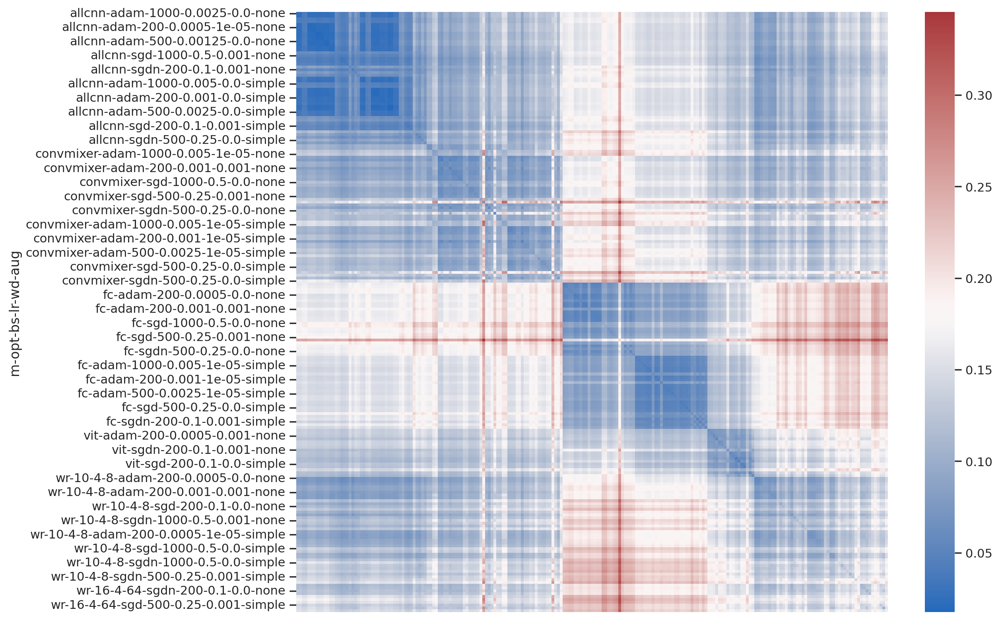

In [166]:
pdists, rows, columns = plot_pairwise_dist(dists, didx[cols].round(5),
                                          tidxs=slice(50,51),
                                          sortby=[2, 1, 5, 0], 
                                          xblock_size=10, yblock_size=10, square=True, 
                                          label_idxs=slice(0,None), return_didx=True,
                                          reduction='avg_pool2d',annot=False)

linkage, cluster, sorted_dists = cluster_corr(pdists)
cs = ['-'.join(l) for l in columns]
rs = ['-'.join(l) for l in rows]
plt.figure(figsize=(12, 10))
sns.heatmap(pd.DataFrame(pdists, index=pd.MultiIndex.from_arrays(columns.T, names=cols)),
#             center=0.1,
            yticklabels='auto', xticklabels=False, cmap='vlag')

### Training

<AxesSubplot:ylabel='m-opt-bs-lr-wd-aug'>

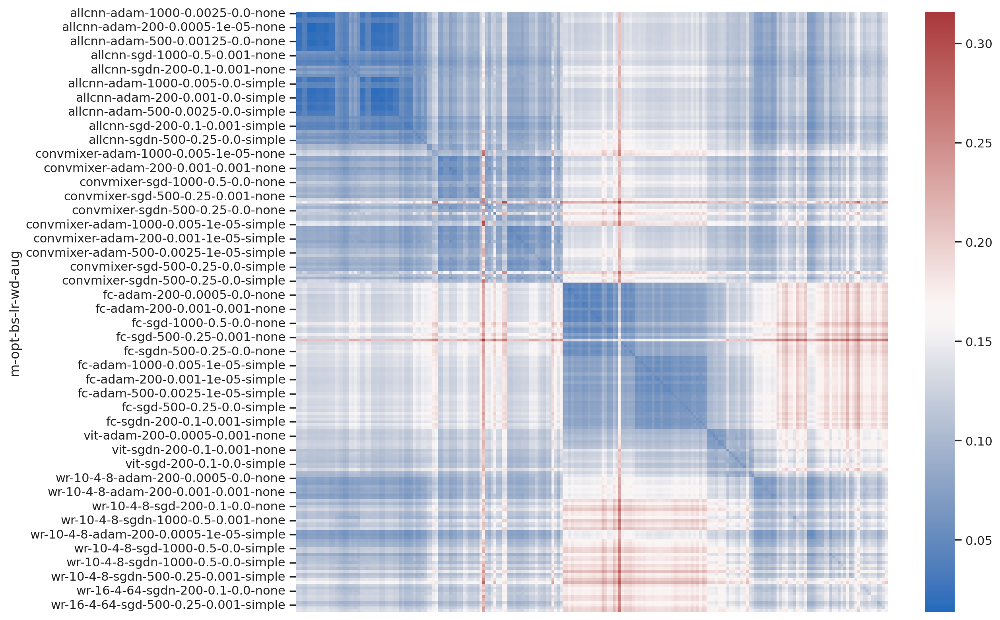

In [173]:
pdists, rows, columns = plot_pairwise_dist(dists, didx[cols].round(5),
                                          tidxs=slice(50,51),
                                          sortby=[2, 1, 5, 0], 
                                          xblock_size=10, yblock_size=10, square=True, 
                                          label_idxs=slice(0,None), return_didx=True,
                                          reduction='avg_pool2d',annot=False)

linkage, cluster, sorted_dists = cluster_corr(pdists)
cs = ['-'.join(l) for l in columns]
rs = ['-'.join(l) for l in rows]
plt.figure(figsize=(12, 10))
sns.heatmap(pd.DataFrame(pdists, index=pd.MultiIndex.from_arrays(columns.T, names=cols)),
#             center=0.1,
            yticklabels='auto', xticklabels=False, cmap='vlag')

In [167]:
columns = np.hstack([columns, (columns[:,2].astype('float') / columns[:,3].astype('float')).astype('str')[:, None]])

A hierarchical clustering dendrogram of all trained models.

- Taking a cut at ~0.6 we can see almost all cluster contain only a single model architecture.
- For models with the same architecture, augmentation methods is the other thing that 

In [168]:
import matplotlib.colors as mcolors
colors = list(mcolors.BASE_COLORS.keys())
label_by = 0
cdict = {c: colors[i] for (i, c) in enumerate(set(columns[:, label_by]))}
cs_ = columns[:, :6]
cs = ['.'.join(l) for l in cs_]

### Validation

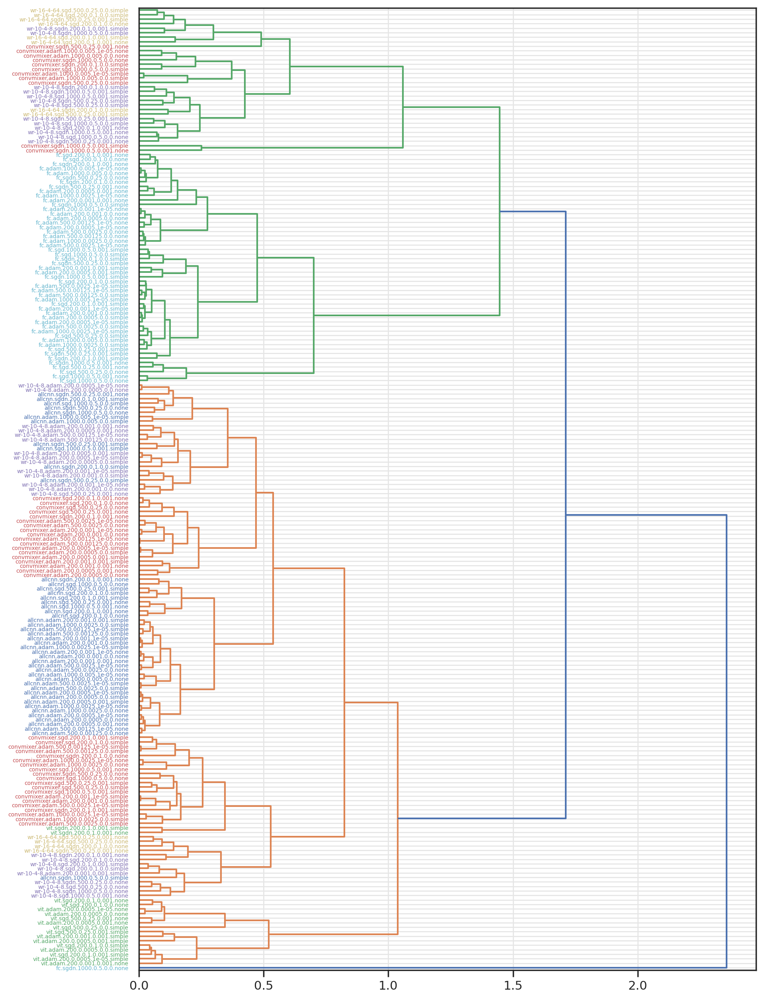

In [169]:
plt.figure(figsize=(10, 16))
dend = sch.dendrogram(linkage, orientation='right', labels=cs)

ax = plt.gca()
for x in ax.get_ymajorticklabels():
    x.set_color(cdict[x.get_text().split('.')[label_by]])

### Training

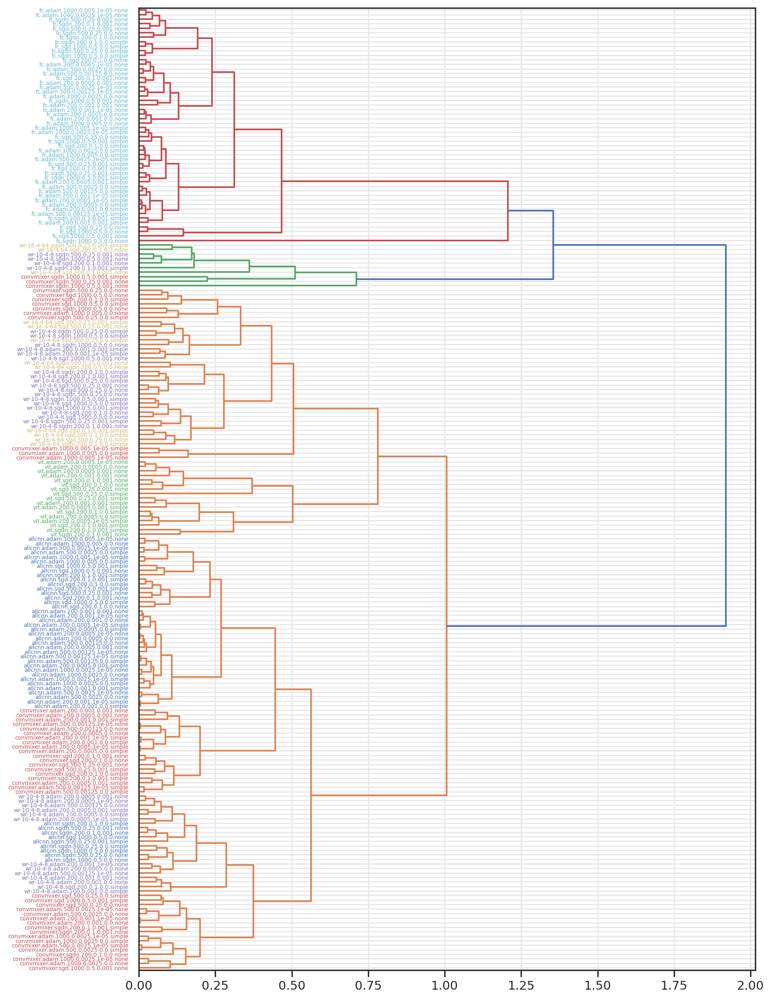

In [162]:
plt.figure(figsize=(10, 16))
dend = sch.dendrogram(linkage, orientation='right', labels=cs)

ax = plt.gca()
for x in ax.get_ymajorticklabels():
    x.set_color(cdict[x.get_text().split('.')[label_by]])

### time evolution

In [210]:
i = 25
di = []
for t in range(100):
    pdists, rows, columns = plot_pairwise_dist(dists, didx[cols].round(5),
                                          tidxs=slice(t,t+1),
                                          sortby=[0], 
                                          xblock_size=10, yblock_size=10, square=True, 
                                          label_idxs=slice(0,None), return_didx=True,
                                          reduction='avg_pool2d',annot=False)
    di.append(pdists[:, i])
di = np.stack(di)

In [211]:
df = pd.DataFrame(rows, columns=cols)
df['d2ref'] = np.array_split(di.T, len(df))

In [212]:
df = df.explode('d2ref').explode('d2ref')
df['progress'] = np.tile(np.linspace(0, 1, 100), len(di.T))
df = df.reset_index(drop=True)

In [213]:
df.loc[(df[cols]==rows[i]).all(axis=1),'d2ref'] *= 10/9

<AxesSubplot:xlabel='progress', ylabel='d2ref'>

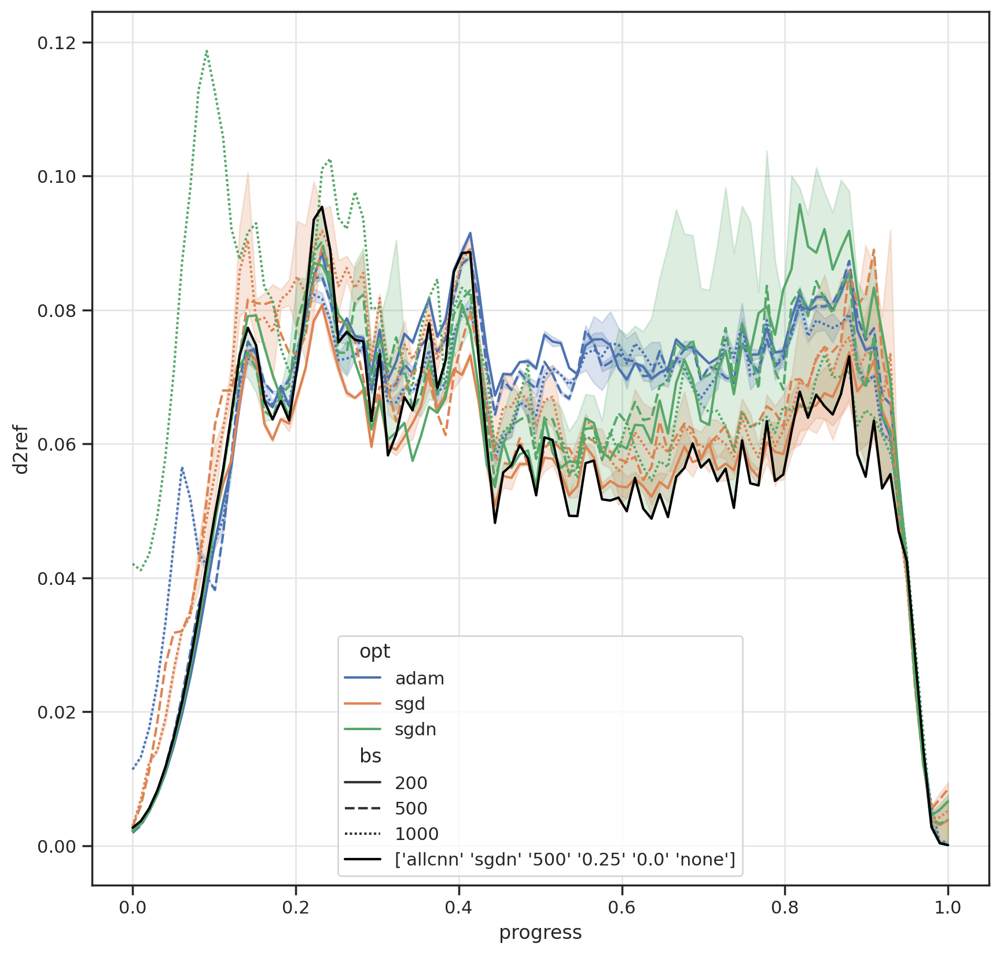

In [215]:
sns.lineplot(data=df[(df[['m', 'aug']]==['allcnn', 'none']).all(axis=1)], x='progress', y='d2ref', hue='opt', style='bs')
sns.lineplot(data=df[(df[cols]==rows[i]).all(axis=1)], 
            x='progress', y='d2ref', label=rows[i], color='black')

In [89]:
n = len(rows)
diag = np.diag(pdists)
diag = diag*100/90
pdists[np.eye(n).astype(bool)] = diag
pdists = pdists / diag

fig = px.imshow(pdists, x=cs, y=rs, color_continuous_scale='RdBu_r')
axis_template = dict(showticklabels = False, ticks = '' )
fig.update_layout(
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 800, height = 800)
fig.show()

In [15]:
cols = ['seed', 'm', 'opt', 'bs','lr', 'wd','err','aug']
didxs, rows, columns = plot_pairwise_dist(dist, didx[cols].round(5), 
    cconds=[lambda x: x[0] > 0.0 and x[1] not in ['fc', 'vit']],
    sortby=[4, 5, 2, 3, 1], xblock_size=10, yblock_size=10, square=True, label_idxs=slice(0,-1), return_didx=True,
    reduction='avg_pool2d',annot=False)
cs = ['-'.join(l) for l in columns]

rs = ['-'.join(l) for l in rows]

fig = px.imshow(didxs, x=cs, y=rs, color_continuous_scale='RdBu_r', origin='lower')
axis_template = dict(showticklabels = False, ticks = '' )
fig.update_layout(
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 800, height = 800)
fig.show()

In [16]:
cols = ['seed', 'm', 'opt', 'bs','lr', 'wd','err','aug']
didxs, rows, columns = plot_pairwise_dist(dist, didx[cols].round(5), 
    cconds=[lambda x: x[0] == -1 and x[1] not in ['fc', 'vit']],
    sortby=[4, 5, 2, 3, 1], xblock_size=1, yblock_size=1, square=True, label_idxs=slice(0,-1), return_didx=True,
    reduction='',annot=False)
cs = ['-'.join(l) for l in columns]
rs = ['-'.join(l) for l in rows]

fig = px.imshow(didxs, x=cs, y=rs, color_continuous_scale='RdBu_r', origin='lower')
axis_template = dict(showticklabels = False, ticks = '' )
fig.update_layout(
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 800, height = 800)
fig.show()

### 3d tensor

In [181]:
key = 'yh'
didx = th.load(f"{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p").reset_index(drop=True)
dists = th.load(f"{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p")

In [182]:
idx = get_idx(didx, "err < 0.1 and seed > 0")
didx = didx.iloc[idx].reset_index(drop=True)
dists = dists[:, :, idx][:, idx, :]

In [183]:
ts = [0, 1, 10, 50, 90]
dt = np.zeros([(len(ts)-1)*len(didx), (len(ts)-1)*len(didx)])
for (i, t) in enumerate(ts):
    for j in range(i+1, len(ts)):
        w = dists[ts[i]:ts[j], :, :]
        dt[i*len(didx):(i+1)*len(didx), (j-1)*len(didx):j*len(didx)] = w.mean(0)
        dt[(j-1)*len(didx):j*len(didx), i*len(didx):(i+1)*len(didx)] = w.mean(0).T

In [184]:
w = dt
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 50)

Projecting


In [185]:
d = None
for i in range(len(ts)-1):
    d_ = didx
    d_['t'] = ts[i+1]
    d = pd.concat([d, d_])
for i in range(7):
    d[f'x{i}'] = r['xp'][:, i]

Text(0.5, 1.0, 'validation')

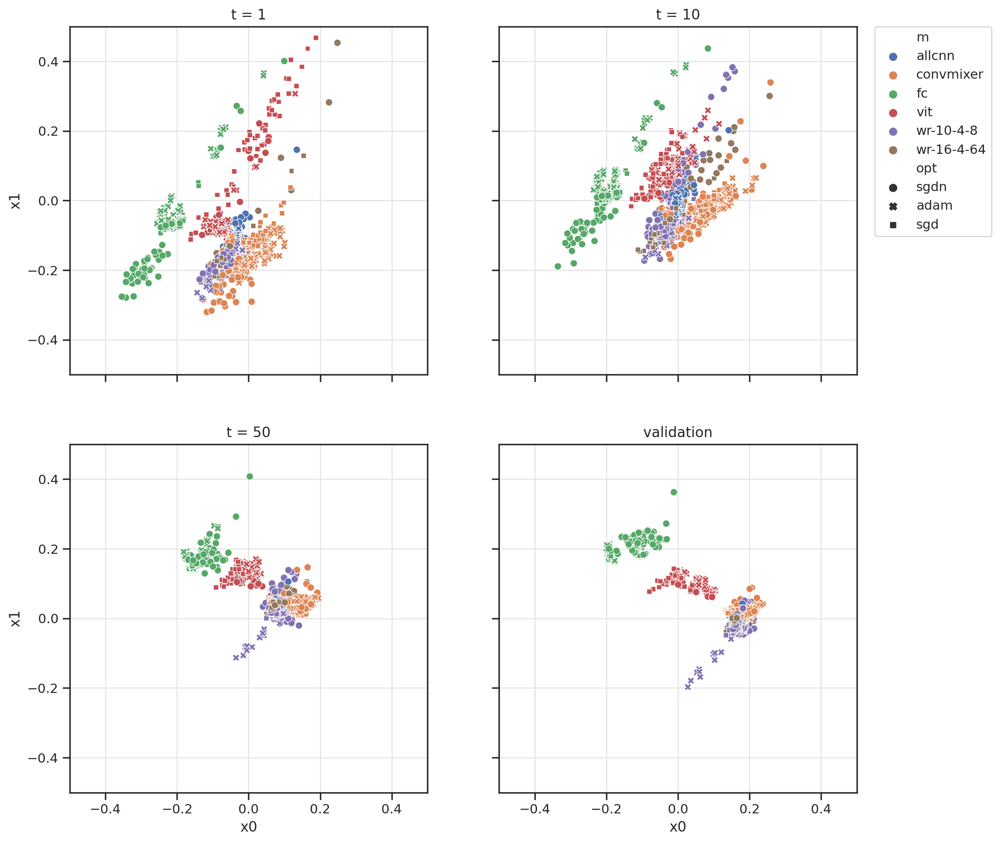

In [180]:
figs, axs = plt.subplots(2, 2, figsize=(12, 12), sharex=True, sharey=True)
for i in range(4):
    t = ts[i+1]
    legend=(t==10)
    ax = axs[i//2, i%2]
    sns.scatterplot(data=d[d.t==t].reset_index(drop=True),  x='x0', y='x1', hue='m', style='opt', legend=legend,
                   ax=ax)
    ax.set_title(f"t = {t}")
    ax.set_xlim([-0.5, 0.5])
    ax.set_ylim([-0.5, 0.5])
    if legend:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(f"validation")

Text(0.5, 1.0, 'training')

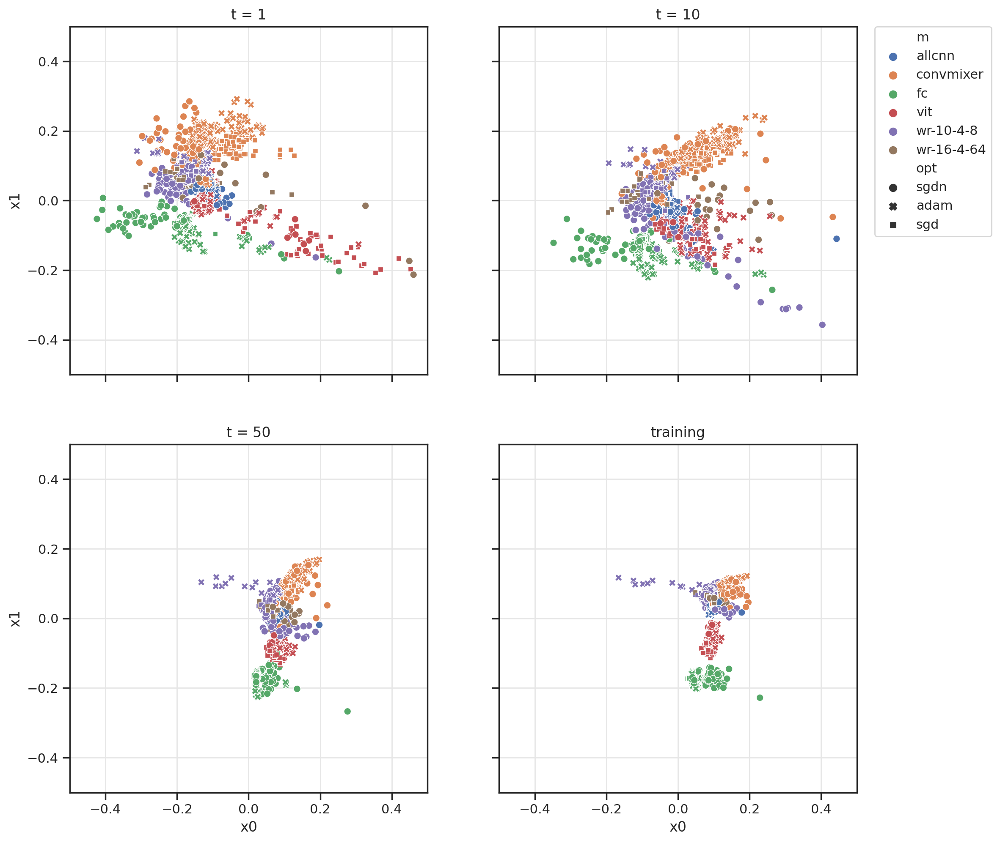

In [186]:
figs, axs = plt.subplots(2, 2, figsize=(12, 12), sharex=True, sharey=True)
for i in range(4):
    t = ts[i+1]
    legend=(t==10)
    ax = axs[i//2, i%2]
    sns.scatterplot(data=d[d.t==t].reset_index(drop=True),  x='x0', y='x1', hue='m', style='opt', legend=legend,
                   ax=ax)
    ax.set_title(f"t = {t}")
    ax.set_xlim([-0.5, 0.5])
    ax.set_ylim([-0.5, 0.5])
    if legend:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('training')

In [14]:
r['fn'] = np.linalg.norm(w, 'fro')

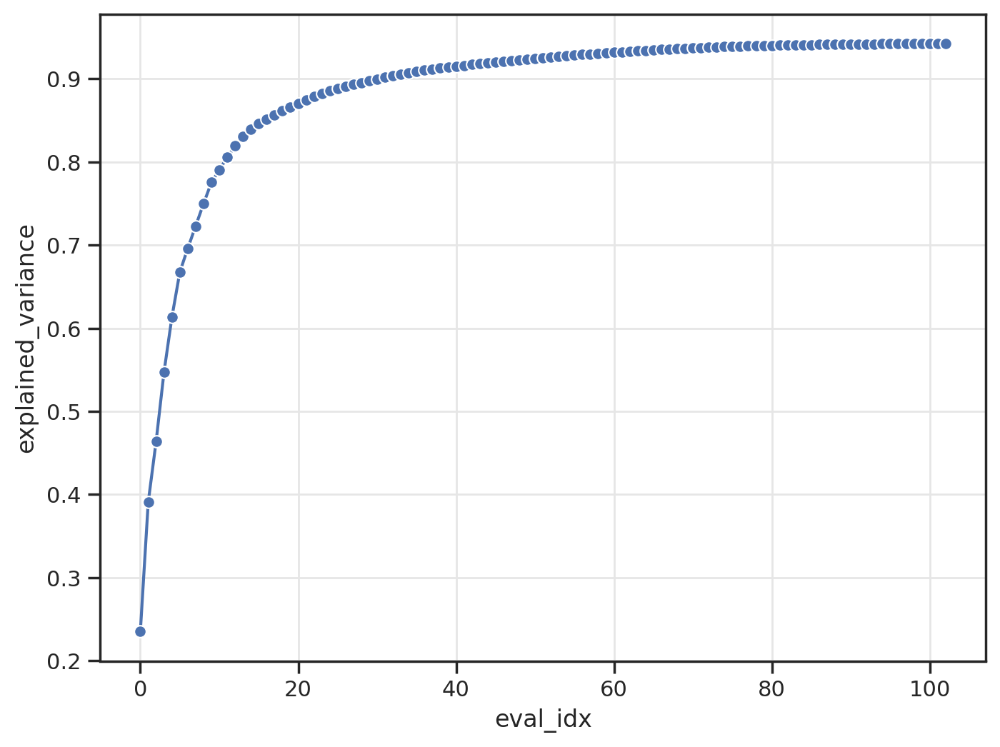

In [15]:
es = r['e']
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), explained_variance=1 - np.sqrt(1-np.cumsum(es ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='explained_variance', marker="o")

### avg_models

In [199]:
seed = -1
m = 'allcnn'

In [200]:
w = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/w_yh_({seed}, '{m}').p")
didx = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/didx_yh_({seed}, '{m}').p")

In [194]:
w = w[:-100, :-100]
didx = didx.iloc[:-100]

In [208]:
ne=3
n = w.shape[0]
l = np.eye(n) - 1.0/n
w = -l @ w @ l / 2
r = proj_(w, n, ne)
print(r['e'])

Projecting
[-162.95828153  -20.7327514     9.69726327   -5.8437449    -2.6751636
   -1.76007369    1.75492232    0.31633545    0.20956614]


In [202]:
for i in range(7):
    didx[f"x{i+1}"] = r['xp'][:, i]

In [207]:
import plotly.express as px
axis_range = [-0.5, 0.5]
fig=px.scatter_3d(didx, x='x1', y='x2', z='x3', color='opt', symbol='bs')
fig.update_traces(marker_size = 2)
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    scene_xaxis_range=axis_range,
scene_yaxis_range=axis_range,
scene_zaxis_range=axis_range,
scene_aspectmode='cube')

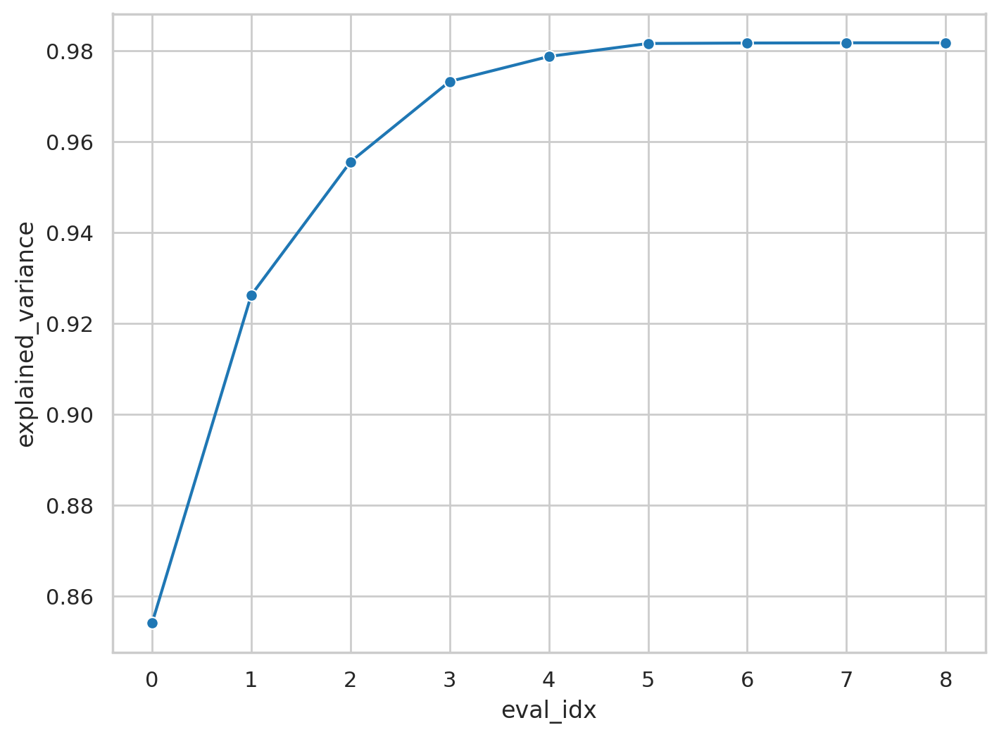

In [206]:
es = r['e']
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), explained_variance=1 - np.sqrt(1-np.cumsum(es ** 2)/np.linalg.norm(w, 'fro')**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='explained_variance', marker="o")

### Tubes -- plots

In [133]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/didx_3d_geod_yh.p').reset_index(drop=True)

In [134]:
dists = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/dists_3d_geod_yh.p')

In [135]:
idx = didx[didx.seed >=0].index
didx = didx.iloc[idx].reset_index(drop=True)
dists = dists[:, :, idx][:, idx, :]

In [136]:
geod_idx = list(didx[didx.m == 'geodesic'].index)

In [137]:
key = 'bs'
choices = [200]
idx = list(didx[didx[key].isin(choices)].index) + geod_idx
d = didx.iloc[idx].reset_index(drop=True)
d = d[d.m != 'geodesic'].reset_index(drop=True)
w = dists[:, :, idx][:, idx, :]

In [138]:
dist2geod = w[:, :-1, -1].T
d['dist_to_geod'] = np.array_split(dist2geod, len(d))
d = d.explode('dist_to_geod').explode('dist_to_geod')
d['t'] = np.tile(np.arange(100), len(dist2geod))

### Validation data

Text(0.5, 1.0, 'bs=[200]')

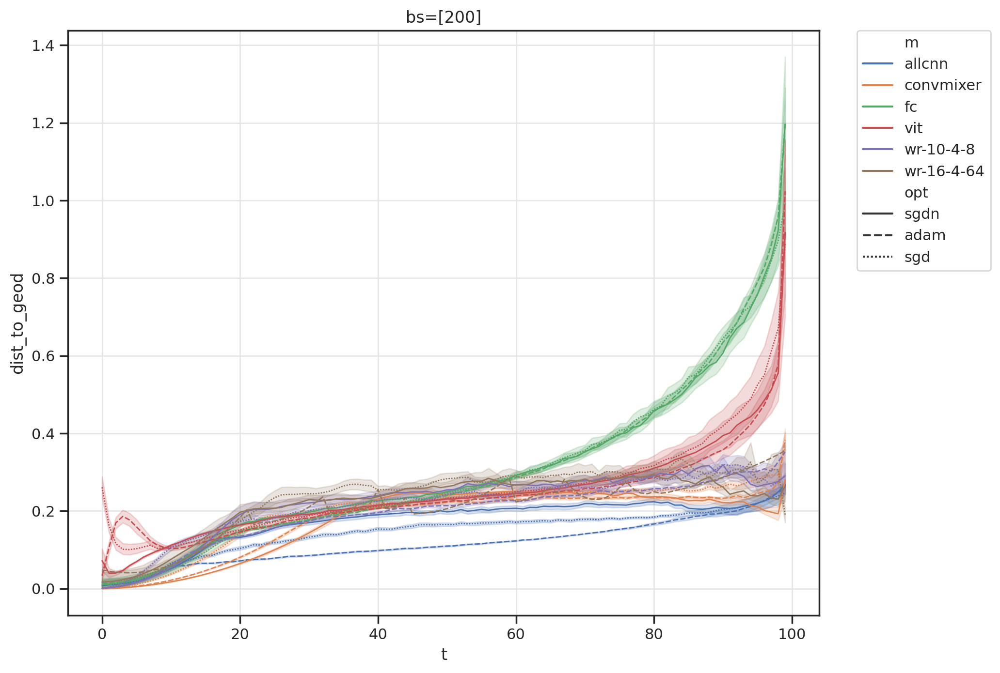

In [132]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='m', style='opt', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(f"{key}={choices}")

Text(0.5, 1.0, "['fc']")

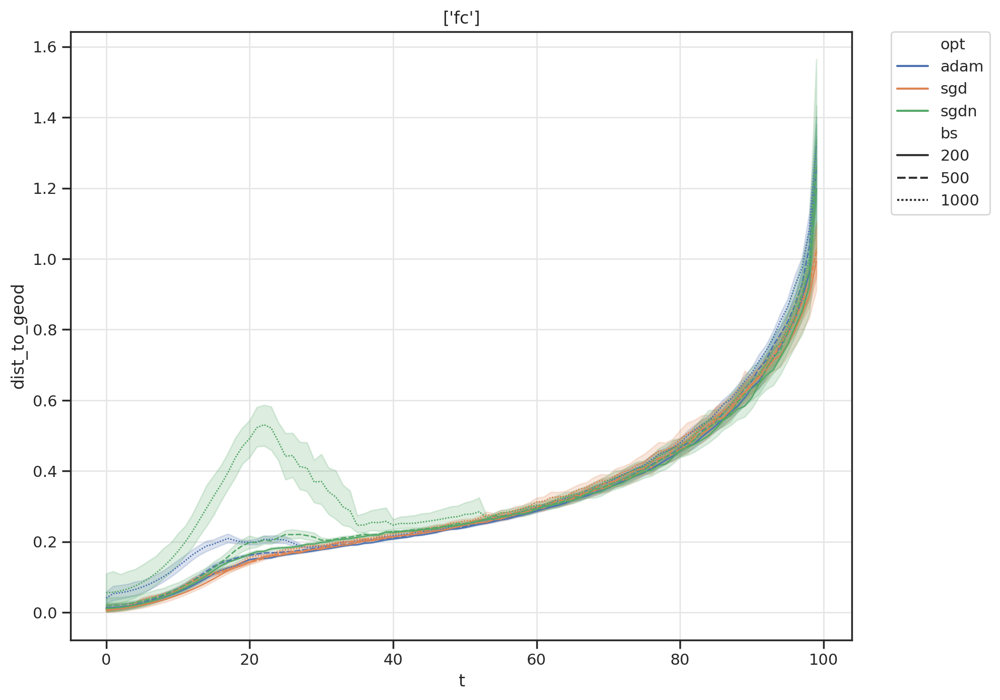

In [24]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='opt', style='bs', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)

Text(0.5, 1.0, "['convmixer']")

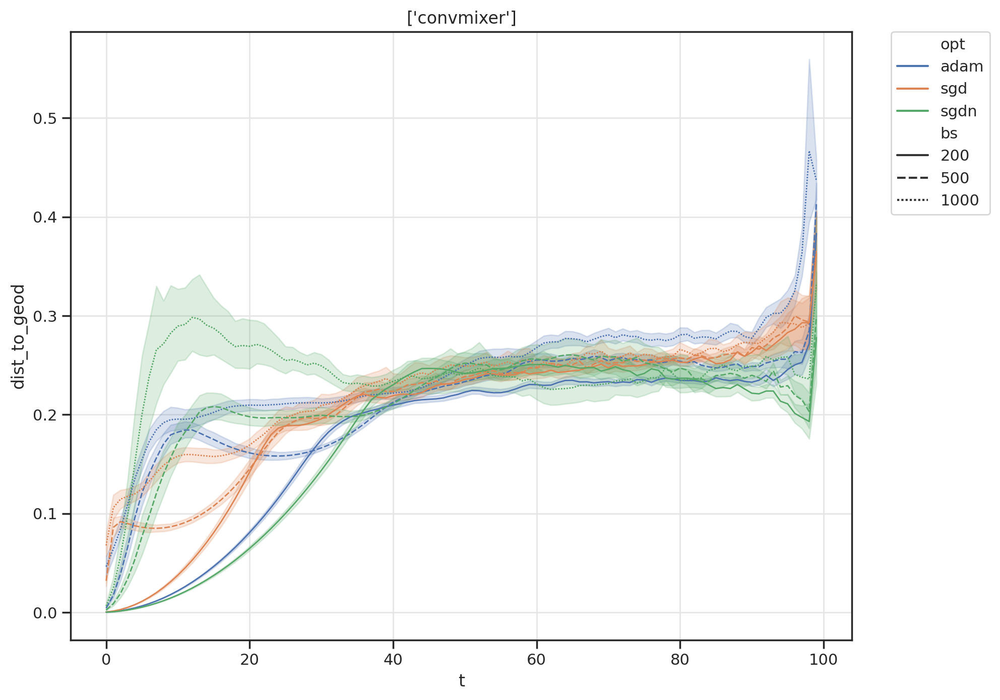

In [18]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='opt', style='bs', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)

### Training data

Text(0.5, 1.0, 'bs=[200]')

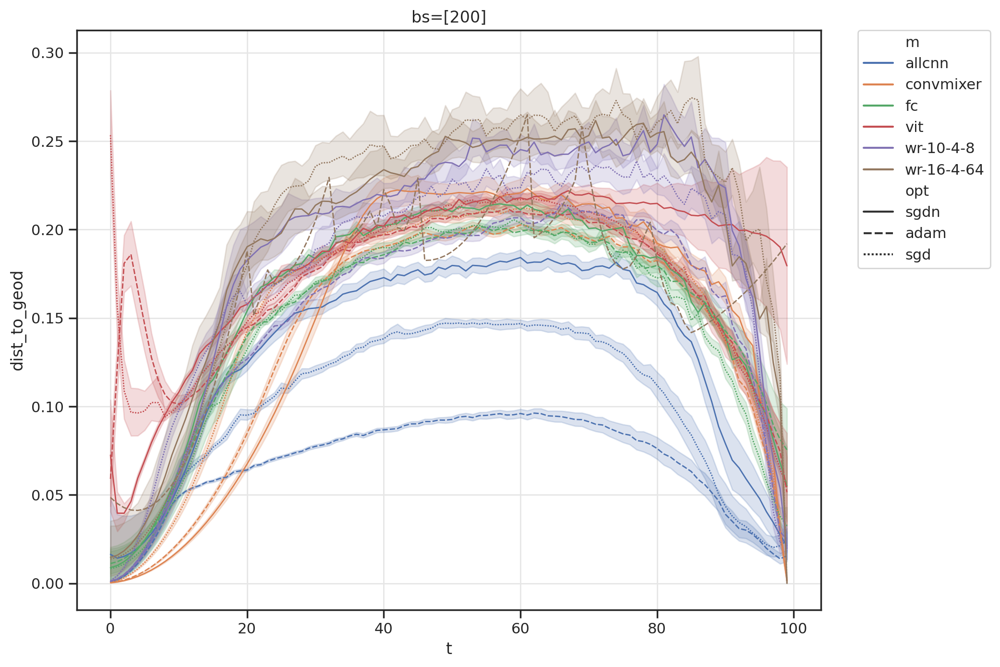

In [139]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='m', style='opt', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(f"{key}={choices}")

Text(0.5, 1.0, 'allcnn')

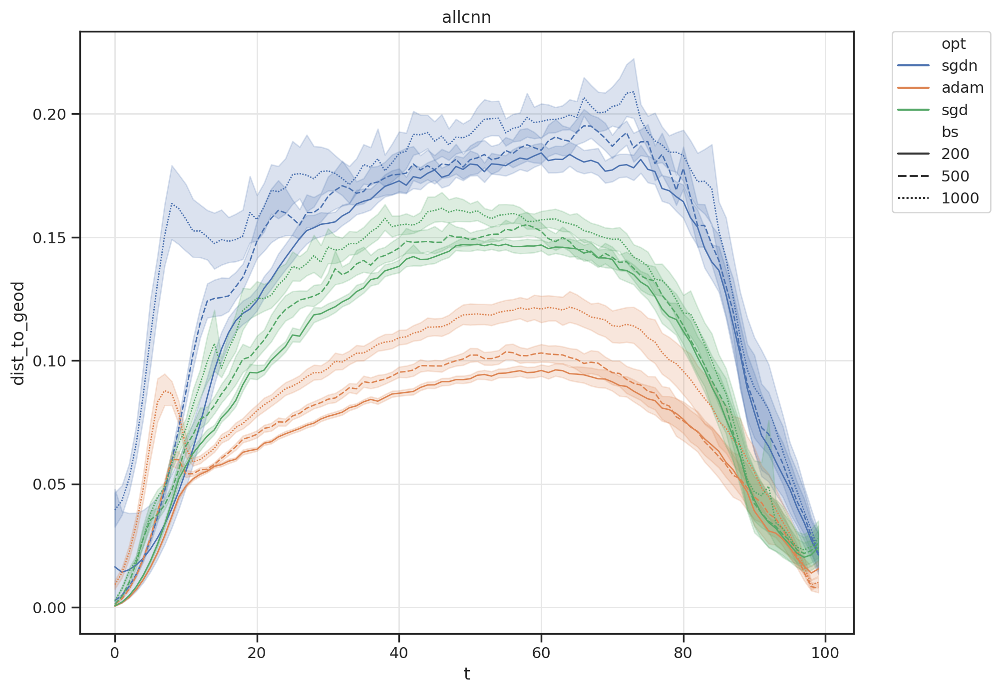

In [19]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='opt', style='bs', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)

Text(0.5, 1.0, 'fc')

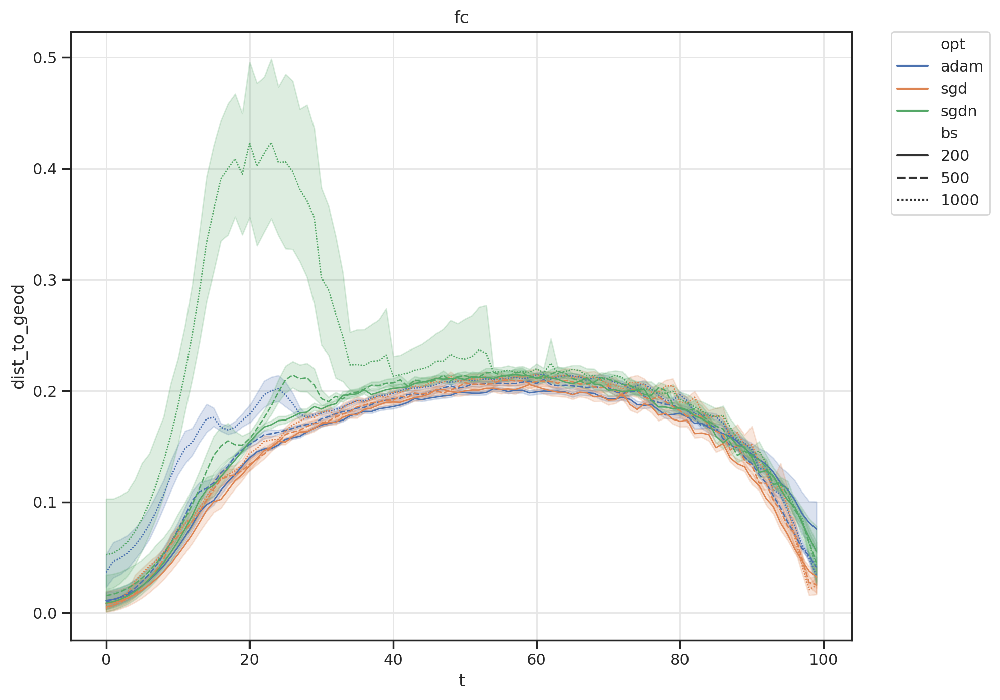

In [25]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.seed>0].reset_index(), x='t', y='dist_to_geod', hue='opt', style='bs', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)

Text(0.5, 1.0, "['wr-10-4-8', 'wr-16-4-64']")

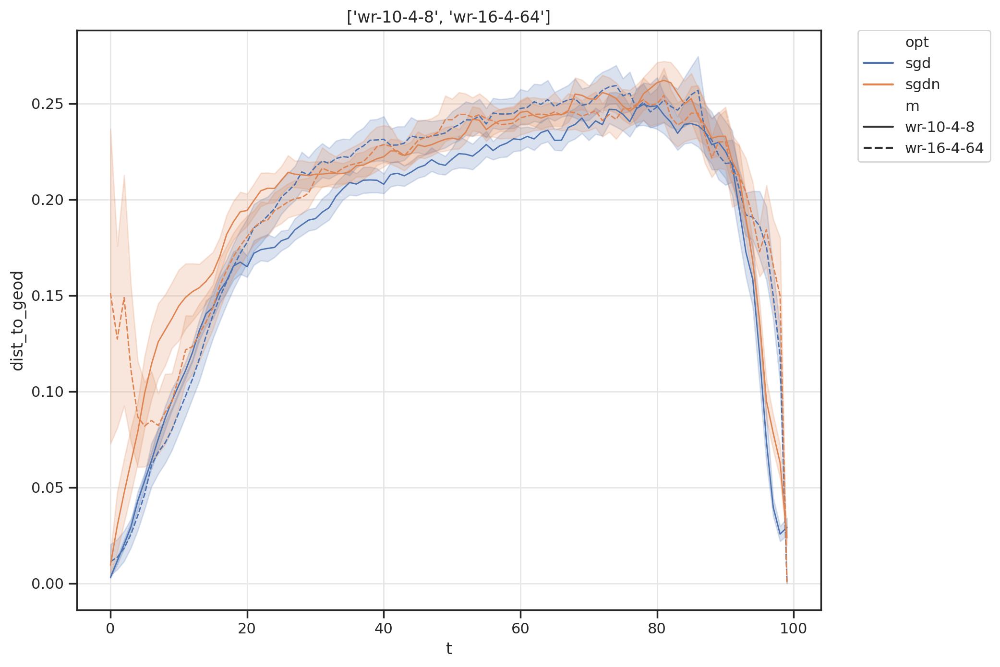

In [121]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d[d.opt!='adam'].reset_index(), x='t', y='dist_to_geod', hue='opt', style='m', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)

Text(0.5, 1.0, "['convmixer']")

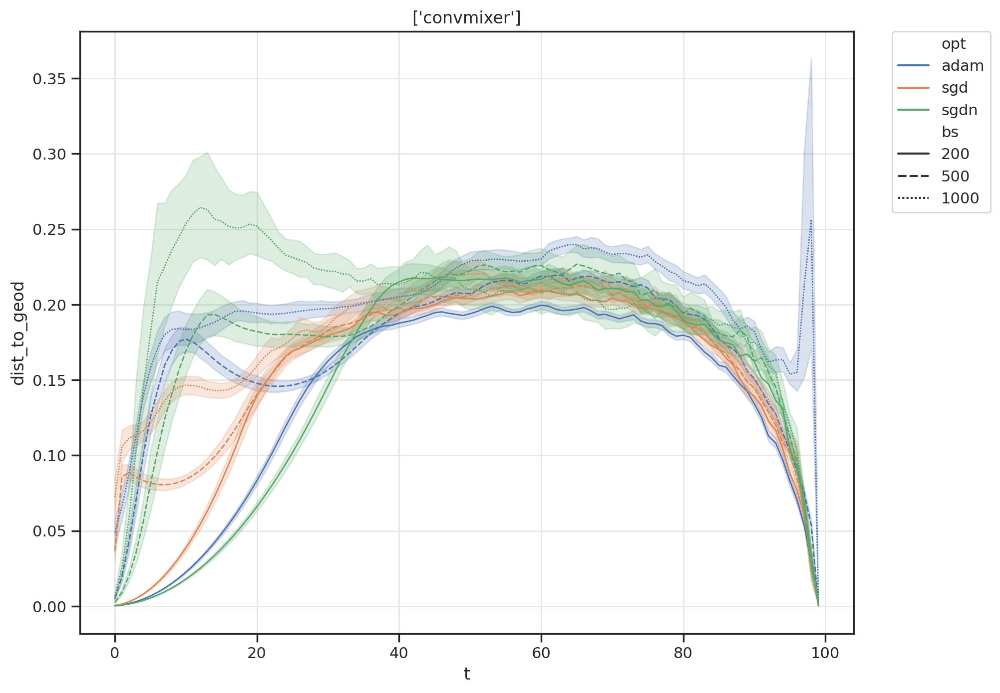

In [130]:
plt.figure(figsize=(10,8))
f = sns.lineplot(data=d.reset_index(), x='t', y='dist_to_geod', hue='opt', style='bs', lw=1)
# f = sns.lineplot(data=d[d.seed==-2].reset_index(), x='t', y='d2geod', hue='m', style='opt', lw=3, legend=False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title(model)